In [2]:
%matplotlib inline
import numpy as np
from scipy import misc
import matplotlib.pyplot as plt

In [5]:
from skimage import data
photo_data = misc.imread(r'''C:\Users\kenog\OneDrive\ONE DRIVE - ALL\DATA ANALYTICS\Data Mining Course\1. UCSanDiego DSE200x - Python for Data Science\wk3\wifire\sd-3layers.jpg''')
type(photo_data)

numpy.ndarray

To show wifire image read earlier....what does this line of code do exactly plt.figure(figsize=(15,15)) Find answer

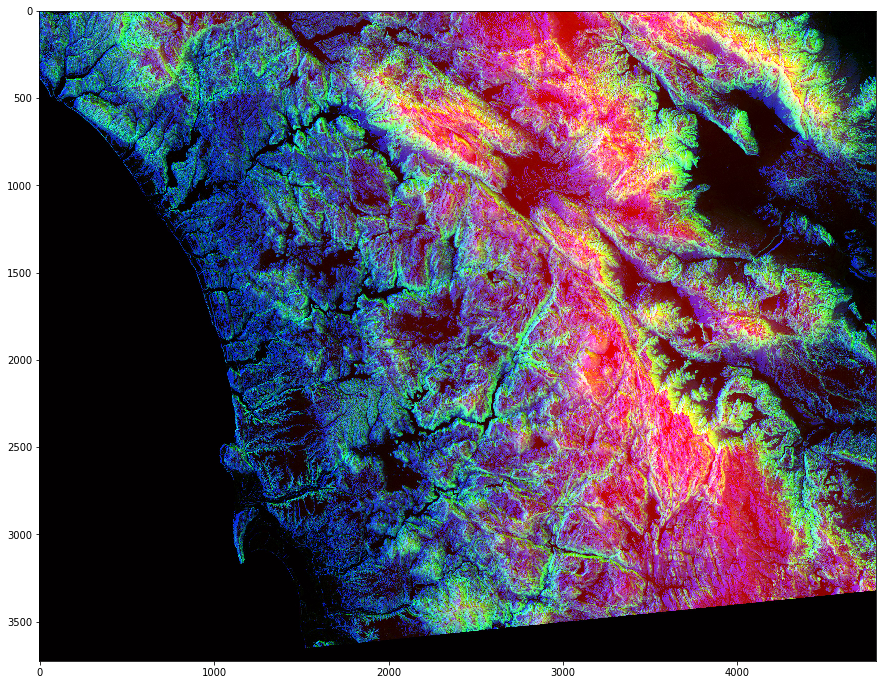

In [7]:
plt.figure(figsize=(15,15)) #frame size of the image
plt.imshow(photo_data)

In [8]:
photo_data.shape

(3725, 4797, 3)

In [10]:
#print(photo_data)

## RGB color mapping in the wifire image;##
**RED pixel represent Altitude**
**BLUE Pixel represent Aspect**
**GREEN Pixel represent Slope**

The higher value of any of these color indicate higher altitude, aspect or slope respectively

In [11]:
photo_data.size

53606475

min max here represents image color; min of 0 meaning black and max of 255 meaning white *reference to RGB color mapping

In [12]:
photo_data.min(),photo_data.max()

(0, 255)

In [13]:
photo_data.mean()

75.829935450894695

### Pixel on the 150th Row and 250th column: ###
Finding the RGB value i.e color combination in row 150 and column 250 shows that the image has [17 red,  35 green, 255 blue] 

In [15]:
photo_data[150,250]

array([ 17,  35, 255], dtype=uint8)

In [16]:
photo_data[150,250,1] #shows the color value of just of Green. #remember indexing 0,1,2 = RGB

35

### Set a pixel to all zeros###

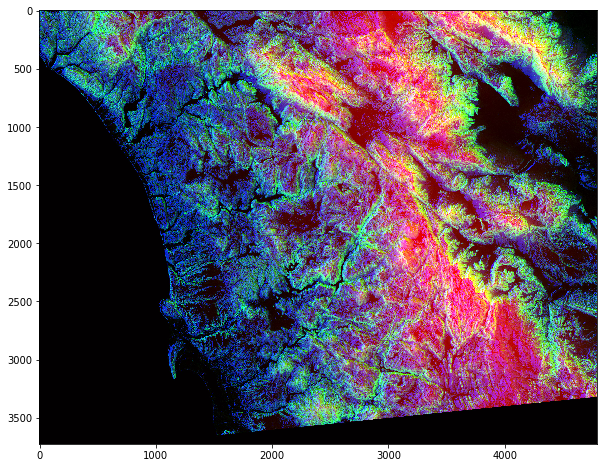

In [17]:
photo_data[150,250] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

*signifcant increase in green value in row of 200 to 800* see how the image looks below

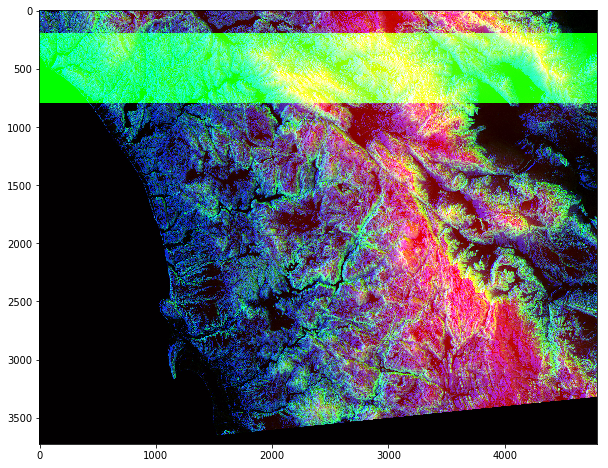

In [20]:
photo_data[200:800, : ,1] = 255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

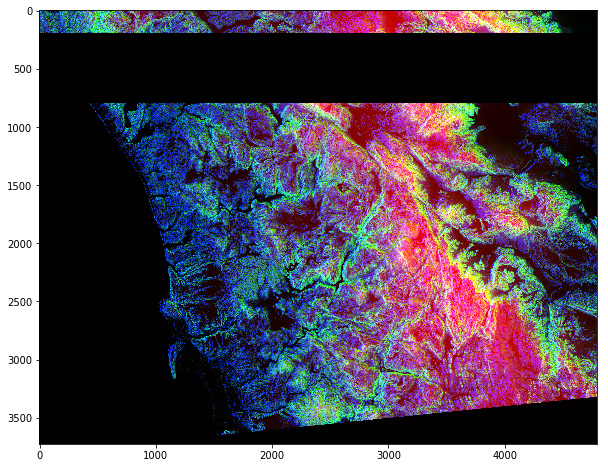

In [28]:
photo2_data = misc.imread(r'''C:\Users\kenog\OneDrive\ONE DRIVE - ALL\DATA ANALYTICS\Data Mining Course\1. UCSanDiego DSE200x - Python for Data Science\wk3\wifire\sd-3layers.jpg''')
photo2_data[200:800, : ,] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo2_data)
# RGB hints: 0 = full black, 255 = full white

In [37]:
photo3_data = misc.imread(r'''C:\Users\kenog\OneDrive\ONE DRIVE - ALL\DATA ANALYTICS\Data Mining Course\1. UCSanDiego DSE200x - Python for Data Science\wk3\wifire\sd-3layers.jpg''')
print("the shape of the image:", photo3_data.shape)
low_value_filter = photo3_data < 200
print("low value filter:",low_value_filter.shape)

the shape of the image: (3725, 4797, 3)
low value filter: (3725, 4797, 3)


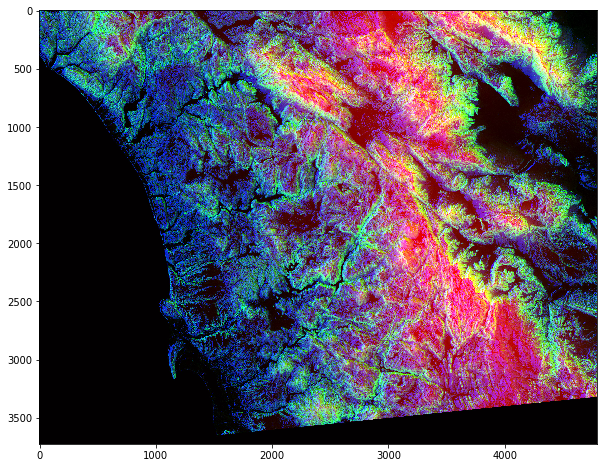

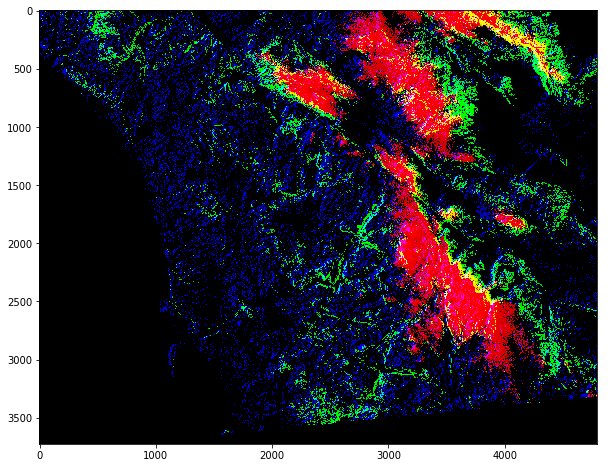

In [38]:
#import random
plt.figure(figsize=(10,10))
plt.imshow(photo3_data)
photo3_data[low_value_filter] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo3_data)

In [39]:
row_range = np.arange(len(photo3_data))
col_range = row_range
print(type(row_range))

<class 'numpy.ndarray'>


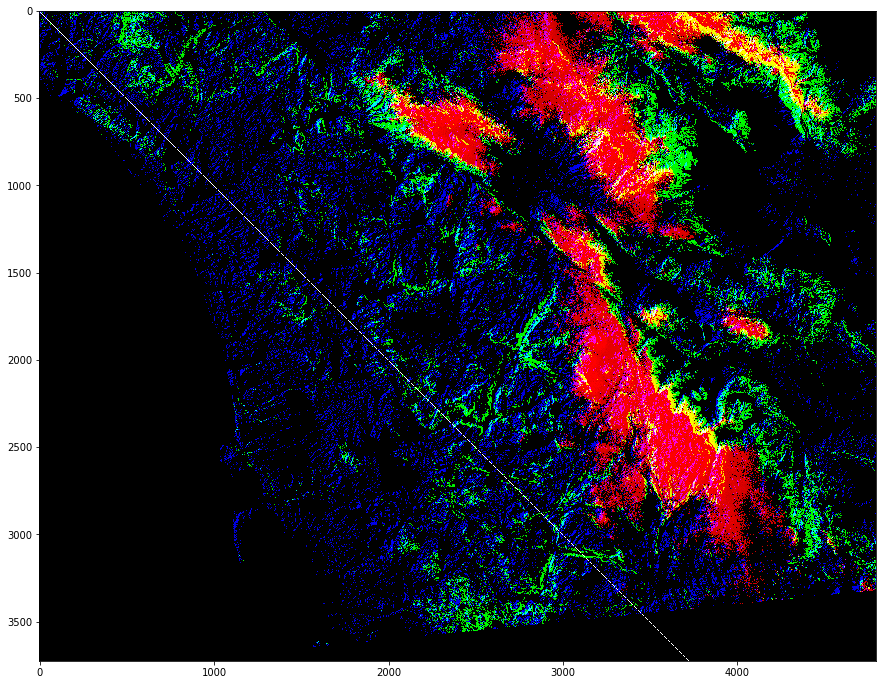

In [40]:
photo3_data[row_range,col_range] = 255
plt.figure(figsize=(15,15))
plt.imshow(photo3_data)

### More on image processing ##
http://www.scipy-lectures.org/advanced/image_processing/

# Satellite Example Part B #

In [43]:
total_rows, total_cols, total_layers = photo3_data.shape
print("photo data =",photo3_data.shape)

photo data = (3725, 4797, 3)


In [44]:
x,y = np.ogrid[:total_rows, :total_cols]
print("x = ", x.shape, "and y =",y.shape)

x =  (3725, 1) and y = (1, 4797)


In [58]:
centre_row, centre_col = total_rows /2, total_cols /2
print("centre row =",centre_row, "and centre column =",centre_col)
print(x - centre_row)
print(y - centre_col)
dist_from_centre =  (x -centre_row)**2 +(y - centre_col)**2
print(dist_from_centre)
radius =(total_rows/2)**2
print("radius =", radius)
circular_mask = (dist_from_centre > radius)
print(circular_mask)
#print(circular_mask[1500:1700,2000:2200])
print("this is value of x and y\n",x,y)

centre row = 1862.5 and centre column = 2398.5
[[-1862.5]
 [-1861.5]
 [-1860.5]
 ..., 
 [ 1859.5]
 [ 1860.5]
 [ 1861.5]]
[[-2398.5 -2397.5 -2396.5 ...,  2395.5  2396.5  2397.5]]
[[ 9221708.5  9216912.5  9212118.5 ...,  9207326.5  9212118.5  9216912.5]
 [ 9217984.5  9213188.5  9208394.5 ...,  9203602.5  9208394.5  9213188.5]
 [ 9214262.5  9209466.5  9204672.5 ...,  9199880.5  9204672.5  9209466.5]
 ..., 
 [ 9210542.5  9205746.5  9200952.5 ...,  9196160.5  9200952.5  9205746.5]
 [ 9214262.5  9209466.5  9204672.5 ...,  9199880.5  9204672.5  9209466.5]
 [ 9217984.5  9213188.5  9208394.5 ...,  9203602.5  9208394.5  9213188.5]]
radius = 3468906.25
[[ True  True  True ...,  True  True  True]
 [ True  True  True ...,  True  True  True]
 [ True  True  True ...,  True  True  True]
 ..., 
 [ True  True  True ...,  True  True  True]
 [ True  True  True ...,  True  True  True]
 [ True  True  True ...,  True  True  True]]
this is value of x and y
 [[   0]
 [   1]
 [   2]
 ..., 
 [3722]
 [3723]
 [372

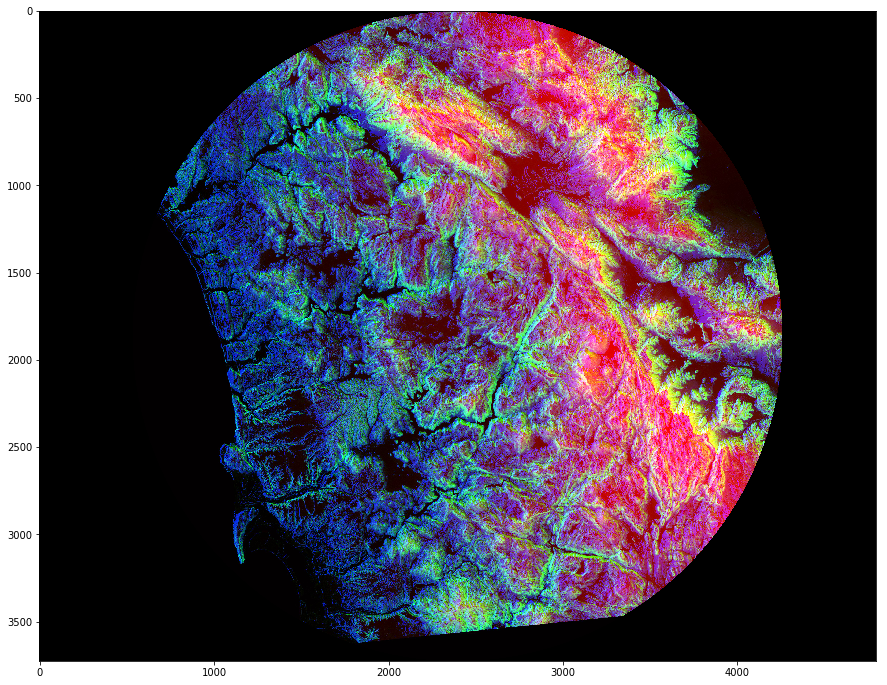

In [47]:
photo3_data = misc.imread(r'''C:\Users\kenog\OneDrive\ONE DRIVE - ALL\DATA ANALYTICS\Data Mining Course\1. UCSanDiego DSE200x - Python for Data Science\wk3\wifire\sd-3layers.jpg''')
photo3_data[circular_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo3_data)

In [59]:
x,y =np.ogrid[:total_rows,:total_cols]
half_upper = x < centre_row
half_upper_mask = np.logical_and(half_upper,circular_mask)

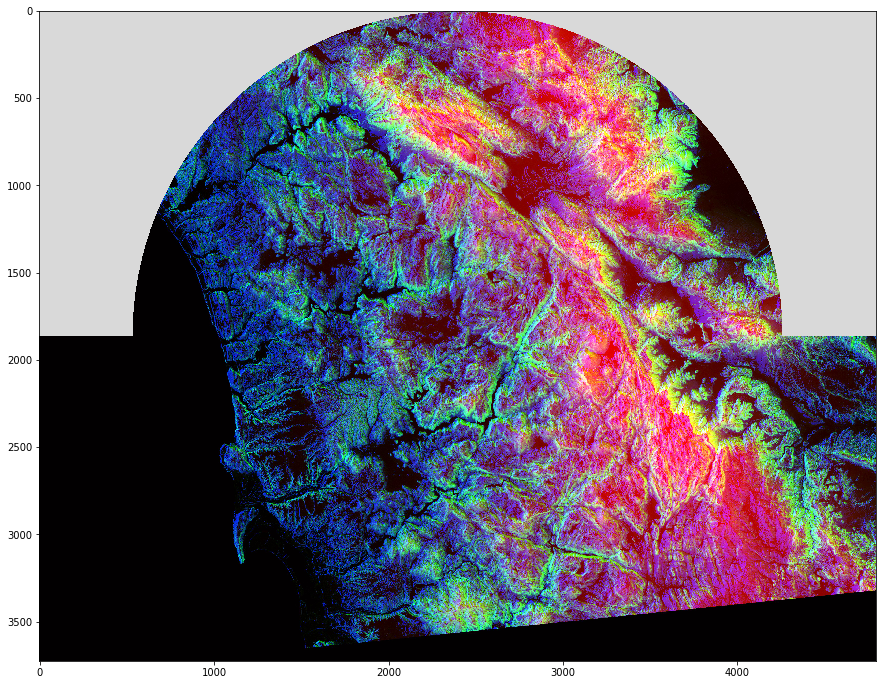

In [61]:
photo3_data = misc.imread(r'''C:\Users\kenog\OneDrive\ONE DRIVE - ALL\DATA ANALYTICS\Data Mining Course\1. UCSanDiego DSE200x - Python for Data Science\wk3\wifire\sd-3layers.jpg''')
photo3_data[half_upper_mask] = 255
photo3_data[half_upper_mask] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo3_data)

**Processing red pixels**

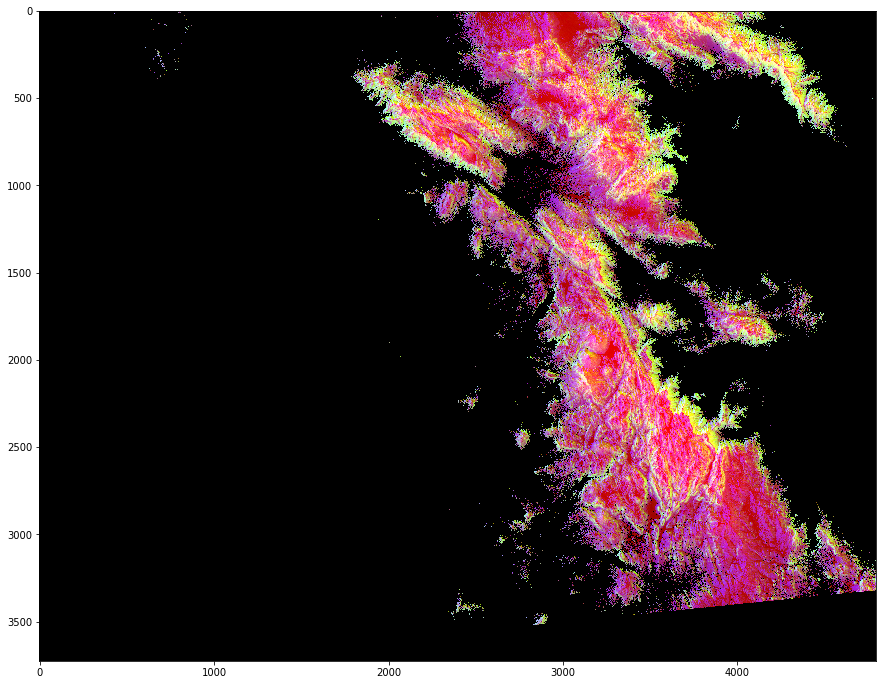

In [62]:
photo3_data = misc.imread(r'''C:\Users\kenog\OneDrive\ONE DRIVE - ALL\DATA ANALYTICS\Data Mining Course\1. UCSanDiego DSE200x - Python for Data Science\wk3\wifire\sd-3layers.jpg''')
red_mask = photo3_data[:,:,0]<150
photo3_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo3_data)

** Processing Green pixels **

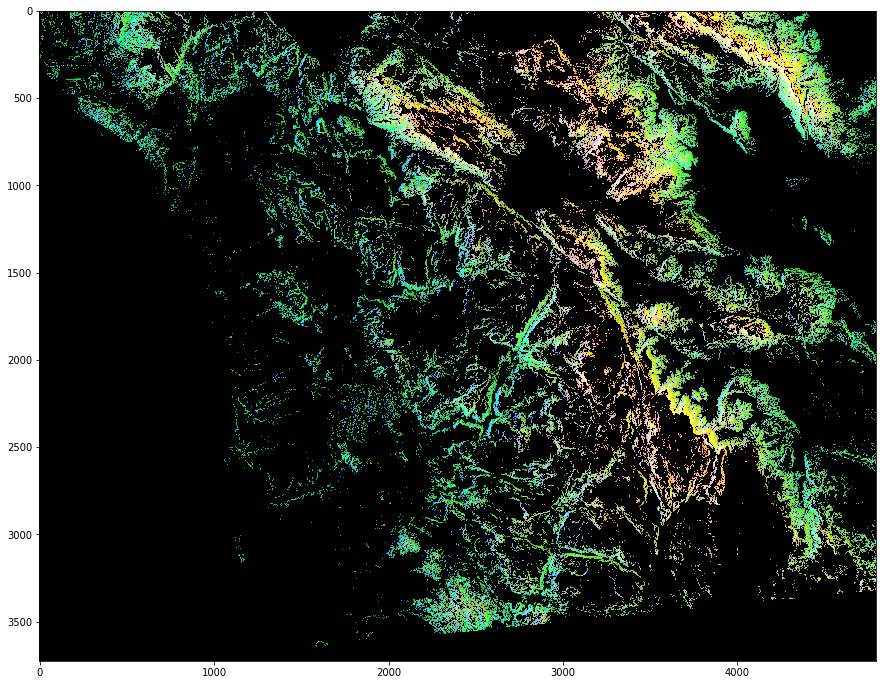

In [63]:
photo3_data = misc.imread(r'''C:\Users\kenog\OneDrive\ONE DRIVE - ALL\DATA ANALYTICS\Data Mining Course\1. UCSanDiego DSE200x - Python for Data Science\wk3\wifire\sd-3layers.jpg''')
green_mask = photo3_data[:,:,1]<150
photo3_data[green_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo3_data)

** Processing Blue pixels **

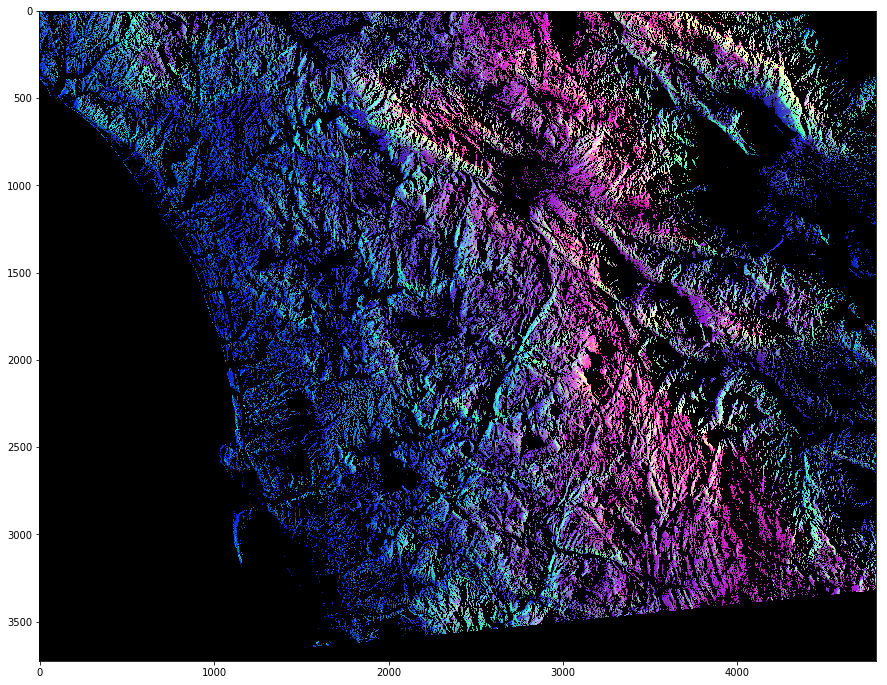

In [64]:
photo3_data = misc.imread(r'''C:\Users\kenog\OneDrive\ONE DRIVE - ALL\DATA ANALYTICS\Data Mining Course\1. UCSanDiego DSE200x - Python for Data Science\wk3\wifire\sd-3layers.jpg''')
blue_mask = photo3_data[:,:,2]<150
photo3_data[blue_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo3_data)

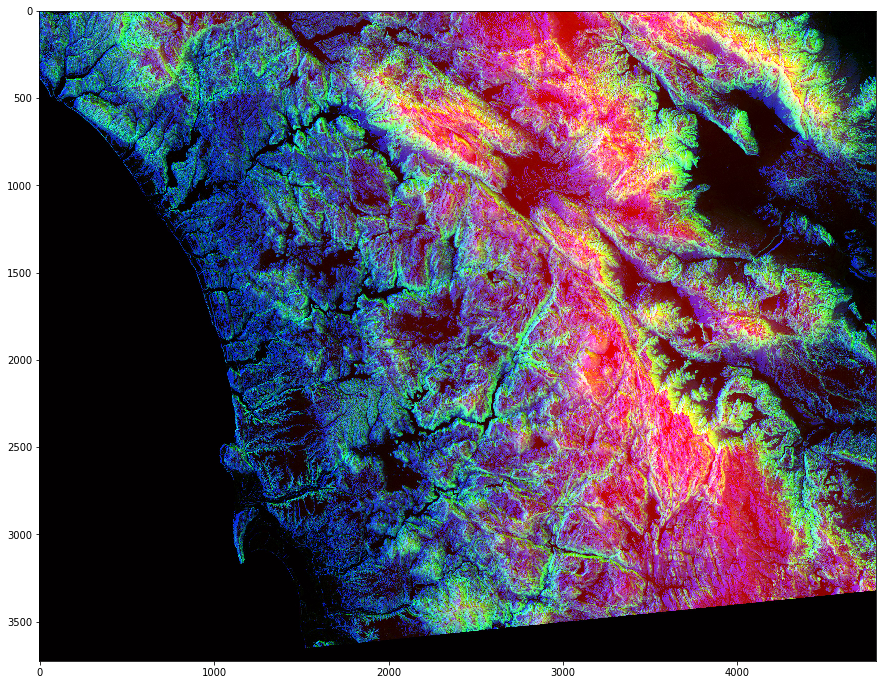

In [66]:
photo3_data = misc.imread(r'''C:\Users\kenog\OneDrive\ONE DRIVE - ALL\DATA ANALYTICS\Data Mining Course\1. UCSanDiego DSE200x - Python for Data Science\wk3\wifire\sd-3layers.jpg''')
red_mask = photo3_data[:,:,0]<150
green_mask = photo3_data[:,:,1]>100
blue_mask = photo3_data[:,:,2]<100
final_mask = np.logical_and(red_mask,green_mask,blue_mask)
plt.figure(figsize=(15,15))
plt.imshow(photo3_data)

# week 3 quizz #

In [68]:
arr = np.array([[1,2,3],[4,5,6],[7,8,9]])

In [69]:
arr

array([[1, 2, 3],
       [4, 5, 6],
       [7, 8, 9]])

In [70]:
arr[:2,]

array([[1, 2, 3],
       [4, 5, 6]])

In [72]:
arr = np.array([[1,2,3],[4,5,6],[7,8,9]])
slice = arr[:2,1:3]
slice[0,0] = 1

In [73]:
print(slice)

[[1 3]
 [5 6]]


In [74]:
print(arr)

[[1 1 3]
 [4 5 6]
 [7 8 9]]


In [12]:
arr = np.array([[1,2,3],[4,5,6],[7,8,9]])
arr

array([[1, 2, 3],
       [4, 5, 6],
       [7, 8, 9]])

In [14]:
slice = arr[:2,1:3]
slice[0,0]

2

In [15]:
arr[(arr % 2 != 1)]

array([2, 4, 6, 8])

In [16]:
arr[(arr % 2 != 0)]

array([1, 3, 5, 7, 9])

In [17]:
arr[(arr % 2 == 1)]

array([1, 3, 5, 7, 9])

In [18]:
arr[(arr % 2 == 0)]

array([2, 4, 6, 8])

In [21]:
a=np.array(["cat","dog","fish"])
b=np.array(["dog","fish","rabbit"])
#print(np.setdiff1d(a,b))
print(np.setdiff1d(a,b))

['cat']


In [22]:
A = np.array([[1],[2]])
B = np.array([[1,2],[3,4]])
A + B

array([[2, 3],
       [5, 6]])

In [23]:
a = np.array([2, 3])
b1 = np.array([1])
b2 = 1 

In [24]:
a+b1

array([3, 4])

In [25]:
a+b2

array([3, 4])